# DEEPECHO GENERATIVE MODEL

## 0) IMPORT LIBRARIES

In [74]:
import pandas as pd
import matplotlib.pyplot as plt

from sdv.metadata import SingleTableMetadata
from sdv.sequential import PARSynthesizer
from deepecho import PARModel

from sdmetrics.reports.single_table import QualityReport
from sdv.evaluation.single_table import run_diagnostic
from sdv.evaluation.single_table import get_column_plot
from sdmetrics.single_table import NewRowSynthesis

## 1) FILTER THE DATASET

In [169]:
df = pd.read_csv("data/input_syntheticmodels.csv")

In [170]:
# Minimum of 300 days played
patient_days_count = df.groupby('patient_id')['day'].nunique()

selected_patients = patient_days_count[patient_days_count > 1000].index

df = df[df['patient_id'].isin(selected_patients)]

In [171]:
len(df['patient_id'].unique()) # total of patients with the criteria

23

In [78]:
df['patient_id'].unique()

array([  443,   409,   925,  1910,  1754,  4636,  6373,  7323,  7707,
        8014,  9184,  9664, 10228, 11010, 11858, 19469, 19563, 21800,
       25179, 26373, 38501, 40635, 48249], dtype=int64)

In [79]:
subset1 = df[df['patient_id'].isin([443, 409, 925, 1910])]
subset2 = df[df['patient_id'].isin([1754, 4636, 6373, 7323])]
subset3 = df[df['patient_id'].isin([7707, 8014, 9184, 9664])]
subset4 = df[df['patient_id'].isin([10228, 11010, 11858, 19469])]
subset5 = df[df['patient_id'].isin([19563, 21800, 25179, 26373])]
subset6 = df[df['patient_id'].isin([38501, 40635, 48249])]

In [80]:
subset1 = subset1.reset_index(drop=True)
subset2 = subset2.reset_index(drop=True)
subset3 = subset3.reset_index(drop=True)
subset4 = subset4.reset_index(drop=True)
subset5 = subset5.reset_index(drop=True)
subset6 = subset6.reset_index(drop=True)

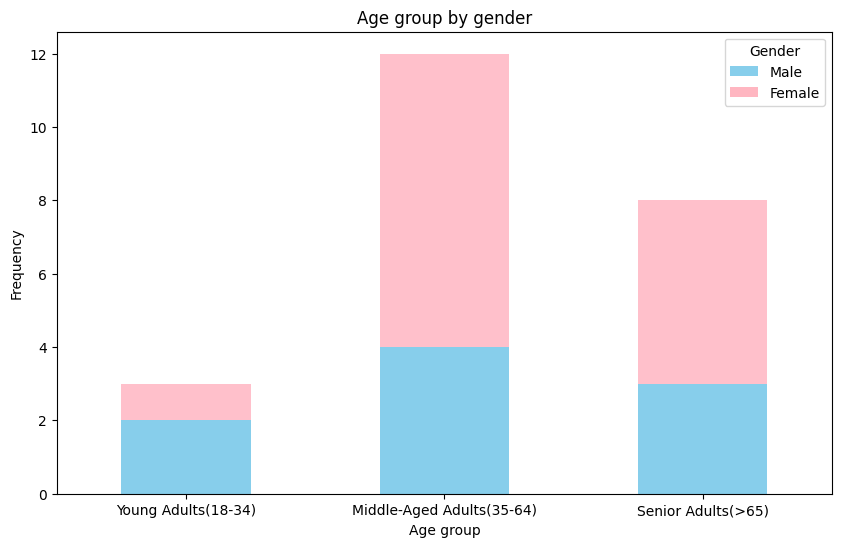

In [81]:
# Distribution of gender and age group
patients = df['patient_id'].unique()
gender = []
age = []
for patient in patients:
    gender.append(df[df['patient_id'] == patient]['gender'].values[0])
    age.append(df[df['patient_id'] == patient]['birthdate'].values[0])

age_gender = pd.DataFrame({'gender': gender, 'birthdate': age})

current_year = 2023
age_gender['birth_year'] = pd.to_datetime(age_gender['birthdate']).dt.year
age_gender = age_gender.dropna(subset=['birth_year'])
age_gender = age_gender[(age_gender['birth_year'] >= 1900) & (age_gender['birth_year'] <= current_year)] # no unreal ages

age_gender["age"] = current_year - age_gender['birth_year']
bins = [0, 17, 34, 64, 123]
labels = ["Children(<17))", "Young Adults(18-34)", "Middle-Aged Adults(35-64)", "Senior Adults(>65)"]

age_gender['age_group'] = pd.cut(age_gender['age'], bins=bins, labels=labels, right=False)

grouped_data = age_gender.groupby(['age_group', 'gender'],observed=True).size().unstack(fill_value=0)

ax = grouped_data.plot(kind= 'bar', stacked = True, figsize=(10,6), color=['skyblue', 'pink'])

plt.title("Age group by gender")
plt.xlabel('Age group')
plt.ylabel('Frequency')
plt.xticks(rotation=0)

male_patch = plt.bar(0, 0, color='skyblue', label='Male')
female_patch = plt.bar(0, 0, color='lightpink', label='Female')
ax.legend(handles=[male_patch, female_patch], title='Gender')

plt.show()

## 2) DEEPECHO MODEL

In [82]:
df.columns # keep df with day to generate day variable

Index(['patient_id', 'day', 'score', 'area_id', 'area_score', 'gender',
       'birthdate'],
      dtype='object')

In [83]:
subset1 = subset1.drop('day', axis=1)
subset2 = subset2.drop('day', axis=1)
subset3 = subset3.drop('day', axis=1)
subset4 = subset4.drop('day', axis=1)
subset5 = subset5.drop('day', axis=1)
subset6 = subset6.drop('day', axis=1)

In [85]:
# Define data types for all the columns
data_types = {
    'patient_id': 'id', 'score': 'continuous', 'area_id': 'count', 'gender': 'categorical',  'birthdate': 'datetime'
}

model = PARModel(epochs=10, cuda=False)

In [ ]:
patient_ids = subset6['patient_id'].unique()

synthetic_dfs = []

for patient_id in patient_ids:
    subset = df[df['patient_id'] == patient_id]

    model.fit(
    data=subset,
    entity_columns=['patient_id'],
    context_columns=['birthdate', 'gender'],
    data_types=data_types,
)

    # Generate synthetic data with conditions
    synthetic_data = model.sample(num_entities=1)

    synthetic_dfs.append(synthetic_data)

In [101]:
for i, df_subset in enumerate(synthetic_dfs, start=1):
    # Modify the 'patient_id' column in each DataFrame
    df_subset['patient_id'] = i


In [102]:
synthetic_data6 = pd.concat(synthetic_dfs, ignore_index=True)

In [103]:
synthetic_data6.to_csv("data/DeepEcho_synt_6.csv", index=False)

In [153]:
synthetic_data1 = pd.read_csv("data/DeepEcho_synt_1.csv")
synthetic_data2 = pd.read_csv("data/DeepEcho_synt_2.csv")
synthetic_data3 = pd.read_csv("data/DeepEcho_synt_3.csv")
synthetic_data4 = pd.read_csv("data/DeepEcho_synt_4.csv")
synthetic_data5 = pd.read_csv("data/DeepEcho_synt_5.csv")
synthetic_data6 = pd.read_csv("data/DeepEcho_synt_6.csv")


In [155]:
# Assuming you have a list of DataFrames: synthetic_data2, synthetic_data3, ...
dataframes = [synthetic_data2, synthetic_data3, synthetic_data4, synthetic_data5, synthetic_data6]

# Define the replacement mapping
replacement_mapping = {
    1: [5, 9, 13, 17, 21],
    2: [6, 10, 14, 18, 22],
    3: [7, 11, 15, 19, 23],
    4: [8, 12, 16, 20]
}

# Loop through each DataFrame and replace values in the 'patient_id' column based on the mapping
for df in dataframes:
    df['patient_id'].replace(replacement_mapping, inplace=True)


In [194]:
final_synthetic_data = pd.concat([synthetic_data1, synthetic_data2, synthetic_data3,
                                  synthetic_data4, synthetic_data5, synthetic_data6], ignore_index=True)

In [163]:
# final_data.to_csv("data/DeepEcho_synt_1000.csv", index=False)

In [195]:
# Set the same general score for each unique combination of 'day' and 'patient_id'
final_synthetic_data['score'] = final_synthetic_data.groupby(['day', 'patient_id'])['score'].transform('first')

# Assuming 'area_score' and 'score' should be between 0 and 1
final_synthetic_data['area_score'] = final_synthetic_data['area_score'].clip(0, 1)
final_synthetic_data['score'] = final_synthetic_data['score'].clip(0, 1)

In [196]:
final_synthetic_data

,patient_id,day,score,area_id,area_score,gender,birthdate
0,1,2014-08-27,0.722087,12,0.388293,2.0,1955-12-01
1,1,2019-07-08,0.460837,12,0.459923,2.0,1955-12-01
2,1,2021-09-02,0.326720,42,0.459923,2.0,1955-12-01
3,1,2022-10-13,0.460837,12,0.632925,2.0,1955-12-01
4,1,2020-03-04,0.460837,12,0.459923,2.0,1955-12-01
...,...,...,...,...,...,...,...
299674,19,2022-10-05,0.660445,30,0.183572,2.0,1975-08-04
299675,23,2022-09-16,0.185515,35,0.277512,2.0,1975-08-04
299676,7,2023-07-15,0.293820,12,0.277512,2.0,1975-08-04
299677,11,2021-10-24,0.293820,12,0.277512,2.0,1975-08-04


## 3) MODEL EVALUATION

### 3.1) Distribution of real vs generated data

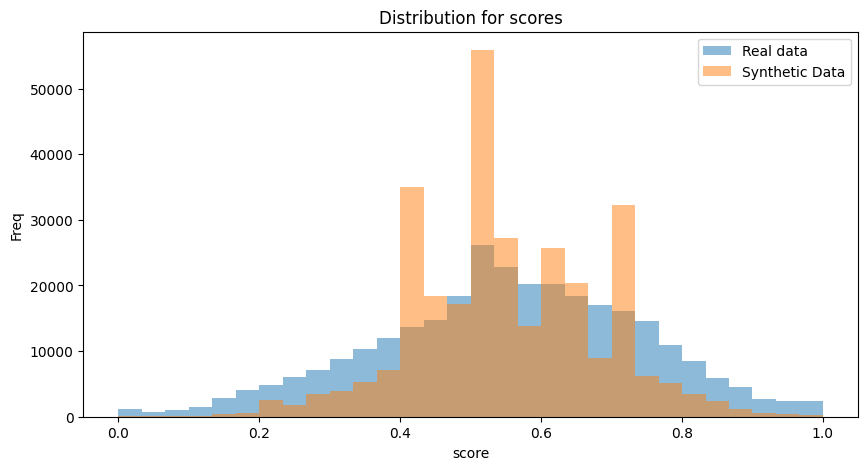

In [197]:
# Compare both datasets
plt.figure(figsize=(10,5))

plt.hist(df["score"], bins=30, alpha=0.5, label= 'Real data')
plt.hist(final_synthetic_data["score"], bins=30, alpha= 0.5, label="Synthetic Data")

plt.title('Distribution for scores')
plt.xlabel('score')
plt.ylabel('Freq')
plt.legend(loc='upper right')
plt.show()

### 3.2) Metadata preparation for report generation

In [198]:
metadata = SingleTableMetadata()
metadata.detect_from_dataframe(data=df) # Automatically detects the features

In [199]:
metadata.update_column(
    column_name='patient_id',
    sdtype = "id",
)

# metadata.set_sequence_index(column_name="day")
metadata.set_sequence_key(column_name='patient_id')

In [200]:
metadata

{
    "sequence_key": "patient_id",
    "columns": {
        "patient_id": {
            "sdtype": "id"
        },
        "day": {
            "sdtype": "datetime"
        },
        "score": {
            "sdtype": "numerical"
        },
        "area_id": {
            "sdtype": "numerical"
        },
        "area_score": {
            "sdtype": "numerical"
        },
        "gender": {
            "sdtype": "categorical"
        },
        "birthdate": {
            "sdtype": "datetime"
        }
    },
    "METADATA_SPEC_VERSION": "SINGLE_TABLE_V1"
}

In [201]:
metadata_dict = {
    "sequence_key": "patient_id",
    "columns": {
        "patient_id": {
            "sdtype": "id"
        },
        "day": {
            "sdtype": "datetime",
            "datetime_format": "%Y-%m-%d"
        },
        "score": {
            "sdtype": "numerical"
        },
        "area_id": {
            "sdtype": "numerical"
        },
        "area_score": {
            "sdtype": "numerical"
        },
        "gender": {
            "sdtype": "categorical"
        },
        "birthdate": {
            "sdtype": "datetime",
            "datetime_format": "%Y-%m-%d"
        }
    },
    "METADATA_SPEC_VERSION": "SINGLE_TABLE_V1",
    "sequence_index": "day"
}

### 3.3) Quality Report

In [202]:
# Evaluation of the synthetic data
report = QualityReport()

#Metadata needs to be passed to a dictionary (just copy content to a new variable)
report.generate(df, final_synthetic_data, metadata_dict)

Generating report ...
(2/2) Evaluating Column Pair Trends: : 100%|██████████| 21/21 [00:09<00:00,  2.13it/s]

Overall Quality Score: 75.56%

Properties:
- Column Shapes: 87.38%
- Column Pair Trends: 63.73%


In [203]:
report.get_details(property_name='Column Shapes')

,Column,Metric,Score
0,day,KSComplement,0.994327
1,score,KSComplement,0.872390
2,area_id,KSComplement,0.562762
3,area_score,KSComplement,0.813264
4,gender,TVComplement,1.000000
5,birthdate,KSComplement,1.000000


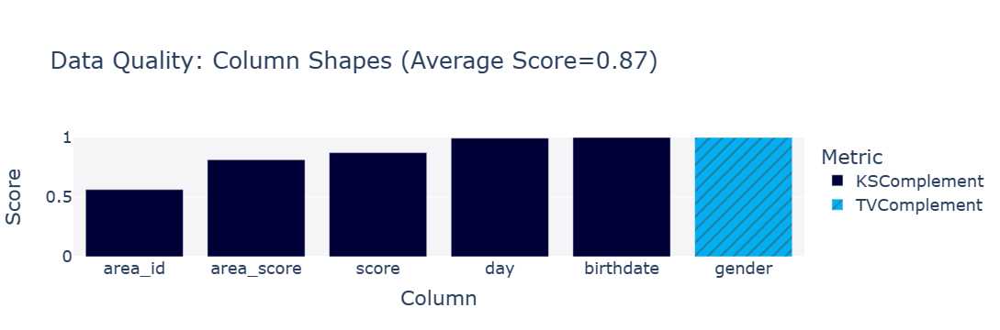

In [204]:
report.get_visualization(property_name='Column Shapes')

### 3.4) Diagnostic Report

In [205]:
diagnostic_report = run_diagnostic(
    real_data=df,
    synthetic_data=final_synthetic_data,
    metadata=metadata)

Generating report ...
(3/3) Evaluating Synthesis: : 100%|██████████| 1/1 [00:00<00:00, 14.07it/s]

Diagnostic Results:

SUCCESS:
✓ The synthetic data covers over 90% of the categories present in the real data
✓ The synthetic data covers over 90% of the numerical ranges present in the real data
✓ The synthetic data follows over 90% of the min/max boundaries set by the real data


In [206]:
diagnostic_report.get_properties()

,Property,Score
0,Coverage,1.000000
1,Boundary,0.999391
2,Synthesis,NaN


### 3.5) Shape of Columns


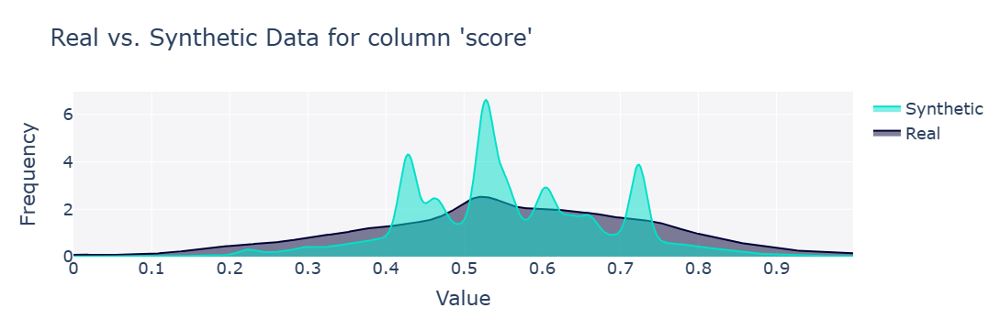

In [207]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=final_synthetic_data,
    metadata=metadata,
    column_name='score'
)
    
fig.show()

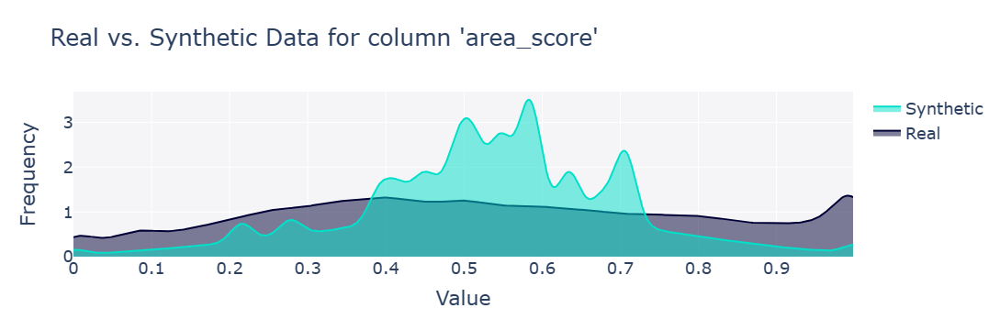

In [208]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=final_synthetic_data,
    metadata=metadata,
    column_name='area_score'
)
    
fig.show()

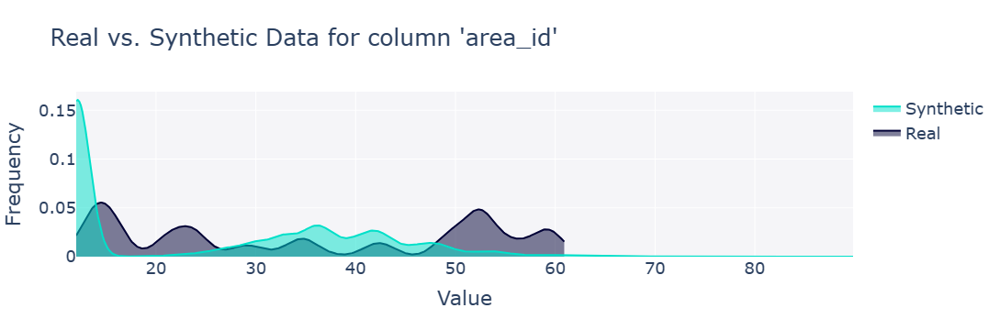

In [209]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=final_synthetic_data,
    metadata=metadata,
    column_name='area_id'
)
    
fig.show()

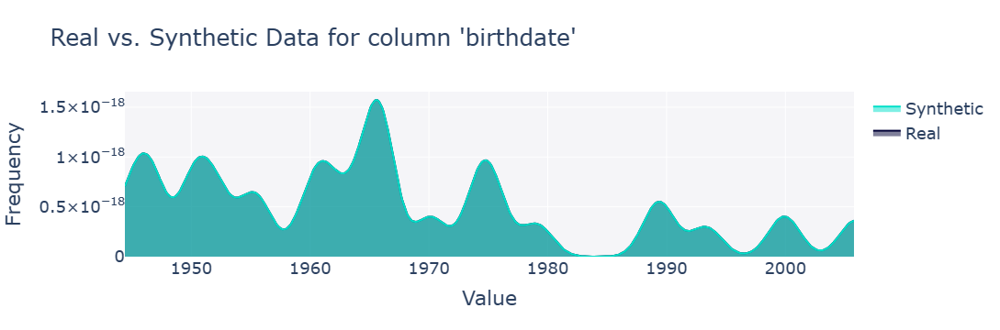

In [210]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=final_synthetic_data,
    metadata=metadata,
    column_name='birthdate'
)
    
fig.show()

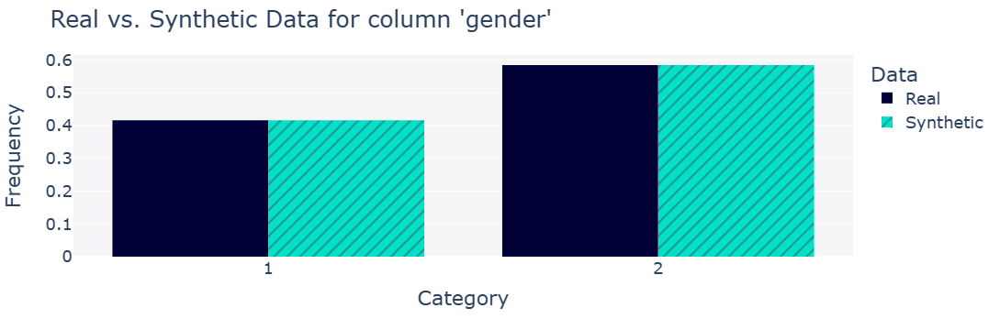

In [211]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=final_synthetic_data,
    metadata=metadata,
    column_name='gender'
)
    
fig.show()

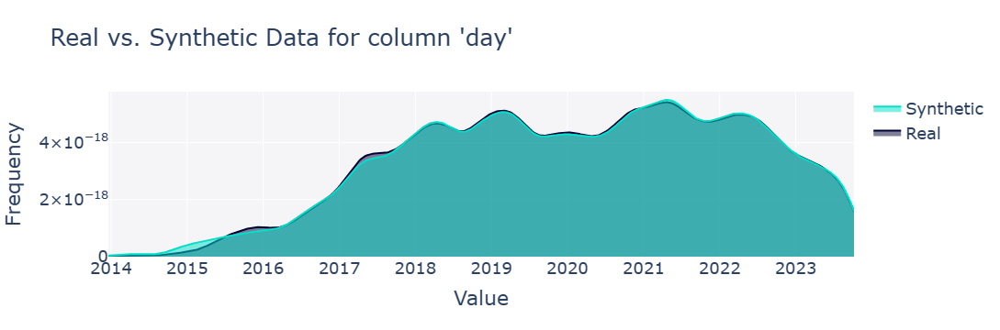

In [212]:
fig = get_column_plot(
    real_data=df,
    synthetic_data=final_synthetic_data,
    metadata=metadata,
    column_name='day'
)
    
fig.show()

In [ ]:
# Privacy score

NewRowSynthesis.compute(
    real_data=df,
    synthetic_data=final_synthetic_data,
    metadata=metadata_dict
)

In [ ]:
# final_synthetic_data.to_csv("data/DeepEcho_synt_1000.csv",index=False)